In [12]:
import ssl
import socket
import OpenSSL
import pandas as pd
from OpenSSL import crypto


In [3]:
names = ['ranking', 'domain']
df_top = pd.read_csv("step0-topsites.csv", names=names)
df_other = pd.read_csv("step0-othersites.csv", names=names)



In [4]:
topcert=[]

def get_cert(name):
    try:
        ctx = ssl.create_default_context()
        connection = socket.create_connection((name, 443))
        s = ctx.wrap_socket(connection, server_hostname=name)
        cert = s.getpeercert(binary_form=True)
        print(name,cert)
        s.close()
        return cert 
    except:
        return None 
    
for i in range(len(df_top)):
    name = df_top.iloc[i, 1]
    cert = get_cert(name)
    topcert.append(cert)






google.com b'0\x82\x0er0\x82\rZ\xa0\x03\x02\x01\x02\x02\x11\x00\xb7\x9f\xfaD\x9c{\x80\xb0\n\xcb\xf8|\x98\xbf\xdf\x180\r\x06\t*\x86H\x86\xf7\r\x01\x01\x0b\x05\x000F1\x0b0\t\x06\x03U\x04\x06\x13\x02US1"0 \x06\x03U\x04\n\x13\x19Google Trust Services LLC1\x130\x11\x06\x03U\x04\x03\x13\nGTS CA 1C30\x1e\x17\r240102130252Z\x17\r240326130251Z0\x171\x150\x13\x06\x03U\x04\x03\x0c\x0c*.google.com0Y0\x13\x06\x07*\x86H\xce=\x02\x01\x06\x08*\x86H\xce=\x03\x01\x07\x03B\x00\x04\x9eZZ\xc5K\x9e\x16\xf6\xe5\xaf\x14\x05\xfae\xdd\xa3K\xc2xj\xb3\xa7\xe3\xb4\xeb\xc4=\x98~\xcb^<,\xb8\x8d0HLC@J>4\xbb\xc3\xe3.P%\x94\xcb\x96q\xa7\x8e@#\x15;\x08\x08`\xeeF\xa3\x82\x0cS0\x82\x0cO0\x0e\x06\x03U\x1d\x0f\x01\x01\xff\x04\x04\x03\x02\x07\x800\x13\x06\x03U\x1d%\x04\x0c0\n\x06\x08+\x06\x01\x05\x05\x07\x03\x010\x0c\x06\x03U\x1d\x13\x01\x01\xff\x04\x020\x000\x1d\x06\x03U\x1d\x0e\x04\x16\x04\x14\xe28\t\x86\xcd\x8e\x1d\xe9xe\xbe\x13\xb6PT0z\x82\x18\x1c0\x1f\x06\x03U\x1d#\x04\x180\x16\x80\x14\x8at\x7f\xaf\x85\xcd\xee\x95\xcd=\

In [9]:
othercert =[]
for i in range(len(df_other)):
    name = df_other.iloc[i, 1]
    cert = get_cert(name)
    othercert.append(cert)

loopme.me b'0\x82\x05\x8e0\x82\x04v\xa0\x03\x02\x01\x02\x02\x12\x04\x97\xf9\xe3\xfaIjT1R\xf4\\|Htd\xefR0\r\x06\t*\x86H\x86\xf7\r\x01\x01\x0b\x05\x00021\x0b0\t\x06\x03U\x04\x06\x13\x02US1\x160\x14\x06\x03U\x04\n\x13\rLet\'s Encrypt1\x0b0\t\x06\x03U\x04\x03\x13\x02R30\x1e\x17\r240106110448Z\x17\r240405110447Z0\x151\x130\x11\x06\x03U\x04\x03\x13\nloopme.com0\x82\x01"0\r\x06\t*\x86H\x86\xf7\r\x01\x01\x01\x05\x00\x03\x82\x01\x0f\x000\x82\x01\n\x02\x82\x01\x01\x00\x9b\x92,\xf4\xe9\xef\xb7^\xde\x0e\xbd\x0b\xae`\xc1\xc5\x1c\xecn\x88\xac!\xee\xe0\x98\xaf\xb5\xf2K\xabR\x93\xeb4\xd3\x9b\xe5\x05\xc0\xe2\xff\x1e\xe5KK\nG6\x88y9\x1fi-\x05\'\r>\xc1\x02\xa1\t\xedR\xe7\xe0i\x94.):\xd5X\xa9\x07w_\xd0\x10\x012s8Xv\x1d\xfda\x0b\x1aQ\xda^\xccx\xb9\xfef\xe0Ef\xd6\x9e"\x08\xd1\x84\xfdB\xd0\x14\xca\xed\xfc\xa6\xe4f\xa9\xb7`\xc6r\xc0\x8b\x97\xc0\xb2\x9f\xfdM\xdf\xc6F\xf8\x96\xc6qK\xcaR\xc9C\x1d\xd8\x93|\x10\xf3[\x89\xaf\xc6\x96\xb1\xfbc\x80v$\x84\xa7a\xab\xc2-L\xe0\x194\xc8Z,\x02\x1d4\xf7\x94d\xbb\x95\xde\xabK

In [19]:
topcert = [crypto.load_certificate(crypto.FILETYPE_PEM, ssl.DER_cert_to_PEM_cert(c)) for c in topcert if c is not None]
othercert = [crypto.load_certificate(crypto.FILETYPE_PEM, ssl.DER_cert_to_PEM_cert(c)) for c in othercert if c is not None]


In [22]:
top_iss = []
other_iss = []

def get_issuer(cert):
    x = cert.get_issuer()
    for c in x.get_components():
        if c[0] == b'O':
            return c[1]
    return 

for i in range(len(topcert)):
   top_iss.append(get_issuer(topcert[i])) 

for i in range(len(othercert)):
   other_iss.append(get_issuer(othercert[i])) 




[b'Google Trust Services LLC', b'DigiCert Inc', b'Microsoft Corporation', b'Google Trust Services LLC', b'Apple Inc.', b'Google Trust Services LLC', b'DigiCert Inc', b'DigiCert Inc', b'Microsoft Corporation', b'Google Trust Services LLC', b'Cloudflare, Inc.', b'DigiCert Inc', b'DigiCert Inc', b'Microsoft Corporation', b'Google Trust Services LLC', b'Google Trust Services LLC', b'DigiCert Inc', b'DigiCert Inc', b'DigiCert Inc', b"Let's Encrypt", b'Microsoft Corporation', b'GlobalSign nv-sa', b'Apple Inc.', b'Google Trust Services LLC', b'Sectigo Limited', b'Google Trust Services LLC', b'DigiCert Inc', b'DigiCert Inc', b'GlobalSign nv-sa', b'DigiCert Inc', b'DigiCert Inc', b'Amazon', b'DigiCert Inc', b'Microsoft Corporation', b'DigiCert Inc', b'Google Trust Services LLC', b'Google Trust Services LLC', b'DigiCert Inc', b'Sectigo Limited', b'Cloudflare, Inc.', b'Google Trust Services LLC', b'Sectigo Limited', b'DigiCert Inc', b'Microsoft Corporation', b'DigiCert Inc', b'Microsoft Corporati

In [36]:
both = top_iss + other_iss
both = set(both)

both = list(both)
print(both)

print(set(top_iss))
print(set(other_iss))

[b'Apple Inc.', b'Amazon', b"Let's Encrypt", b'Nijimo K.K.', b'Corporation Service Company', b'cPanel, Inc.', b'Network Solutions L.L.C.', b'DigiCert, Inc.', b'GoDaddy.com, Inc.', b'Cybertrust Japan Co., Ltd.', b'ZeroSSL', b'Starfield Technologies, Inc.', b'IdenTrust', b'GlobalSign nv-sa', b'Entrust, Inc.', b'COMODO CA Limited', b'TrustAsia Technologies, Inc.', b'GoGetSSL', b'Unizeto Technologies S.A.', b'Internet2', b'Gandi', b'WoTrus CA Limited', b'McAfee, Inc.', b'Deutsche Telekom Security GmbH', b'Sectigo Limited', b'SECOM Trust Systems CO.,LTD.', b'GEANT Vereniging', b'Cloudflare, Inc.', b'DigiCert Inc', b'Certainly', b'Microsoft Corporation', b'Google Trust Services LLC']
{b'Apple Inc.', b'Amazon', b"Let's Encrypt", b'Network Solutions L.L.C.', b'DigiCert, Inc.', b'GoDaddy.com, Inc.', b'Cybertrust Japan Co., Ltd.', b'ZeroSSL', b'IdenTrust', b'GlobalSign nv-sa', b'Entrust, Inc.', b'COMODO CA Limited', b'Internet2', b'Gandi', b'WoTrus CA Limited', b'McAfee, Inc.', b'Sectigo Limited

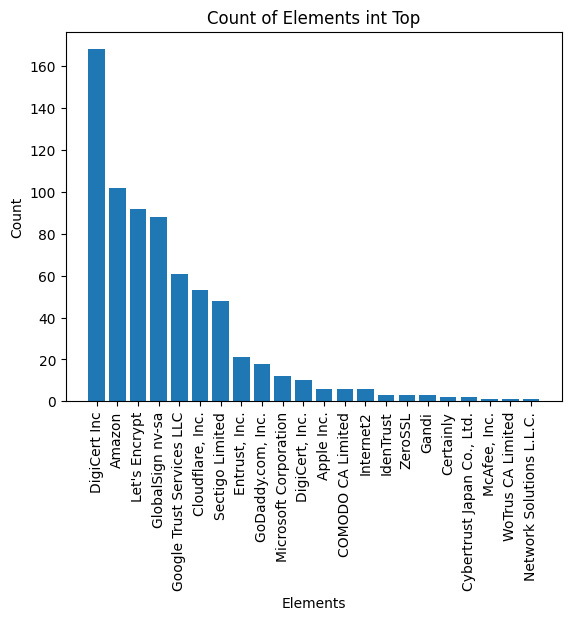

In [39]:
import matplotlib.pyplot as plt
from collections import Counter

topCount = Counter(top_iss)

elements = [item[0] for item in topCount.most_common()]
counts = [item[1] for item in topCount.most_common()]

plt.bar(elements, counts)
plt.xticks(rotation='vertical')

plt.xlabel('Elements')
plt.ylabel('Count')
plt.title('Count of Elements int Top')
plt.show()


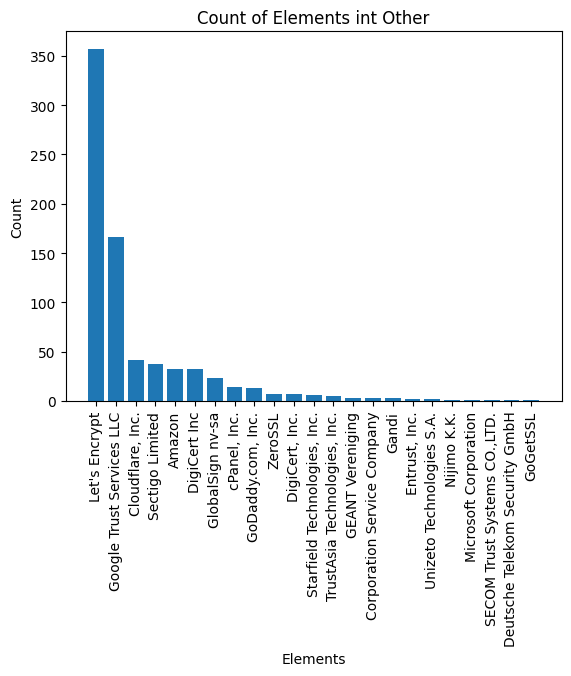

In [38]:
otherCount = Counter(other_iss)

elements = [item[0] for item in otherCount.most_common()]
counts = [item[1] for item in otherCount.most_common()]

plt.bar(elements, counts)
plt.xticks(rotation='vertical')

plt.xlabel('Elements')
plt.ylabel('Count')
plt.title('Count of Elements int Other')
plt.show()

In [68]:
from datetime import datetime
 
timeTop = []
timeOther = []

def get_time(cert):
    before = datetime.strptime(cert.get_notAfter()[:-1].decode('utf-8'), '%Y%m%d%H%M%S')
    after = datetime.strptime(cert.get_notBefore()[:-1].decode('utf-8'), '%Y%m%d%H%M%S')
    return before - after

for i in range(len(topcert)):
   timeTop.append(get_time(topcert[i])) 

for i in range(len(othercert)):
   timeOther.append(get_time(othercert[i])) 


In [69]:
print(timeOther)

[datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=90, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=396, seconds=86399), datetime.timedelta(days=365, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=395, seconds=86399), datetime.timedelta(days=365, seconds=86399), datetime.timedelta(days=365, seconds=86399), datetime.timedelta(days=365, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=396, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=347, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=182, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=393, seconds=86399), datetime.timedelta(days=396, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(days=89, seconds=86399), datetime.timedelta(d

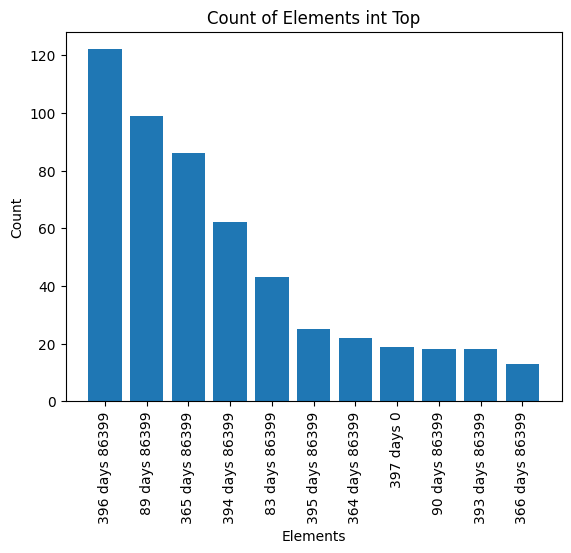

In [72]:
timeTopCount = Counter(timeTop)
elementstime = [str(item[0].days) + " days " + str(item[0].seconds) for item in timeTopCount.most_common()]
countstime = [item[1] for item in timeTopCount.most_common()]


elementstime = elementstime[:11]
countstime = countstime[:11]



plt.bar(elementstime, countstime)
plt.xticks(rotation='vertical')

plt.xlabel('Elements')
plt.ylabel('Count')
plt.title('Count of Elements int Top')
plt.show()

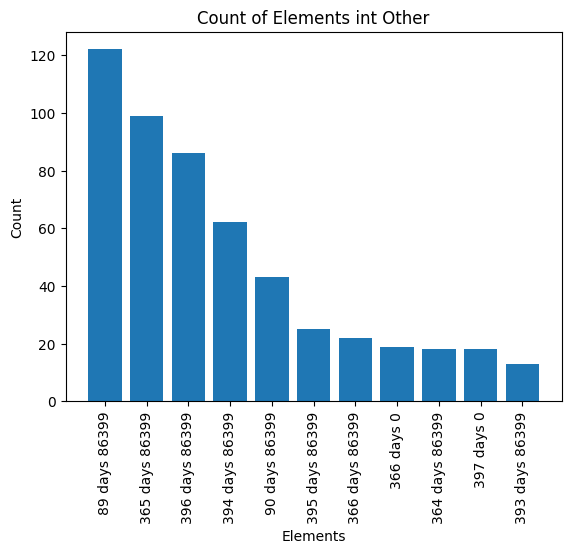

In [71]:
timeOtherCount = Counter(timeOther)
elementstime = [str(item[0].days) + " days " + str(item[0].seconds) for item in timeOtherCount.most_common()]
countstime = [item[1] for item in timeTopCount.most_common()]


elementstime = elementstime[:11]
countstime = countstime[:11]



plt.bar(elementstime, countstime)
plt.xticks(rotation='vertical')

plt.xlabel('Elements')
plt.ylabel('Count')
plt.title('Count of Elements int Other')
plt.show()

In [84]:
topAlgo = []
otherAlgo = []

def get_algo(cert):
   res =  cert.get_pubkey().type()
   if res == OpenSSL.crypto.TYPE_RSA:
      return "RSA"
   elif res == OpenSSL.crypto.TYPE_DSA:
      return "DSA"
   elif res == 408: 
      return "ECDSA"
   return 0
    

for i in range(len(topcert)):
   topAlgo.append(get_algo(topcert[i])) 

for i in range(len(othercert)):
   otherAlgo.append(get_algo(othercert[i])) 


['ECDSA', 'ECDSA', 'RSA', 'ECDSA', 'ECDSA', 'ECDSA', 'RSA', 'ECDSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'ECDSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'ECDSA', 'RSA', 'ECDSA', 'ECDSA', 'ECDSA', 'RSA', 'ECDSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'ECDSA', 'ECDSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'ECDSA', 'RSA', 'RSA', 'RSA', 'RSA', 'ECDSA', 'RSA', 'ECDSA', 'RSA',

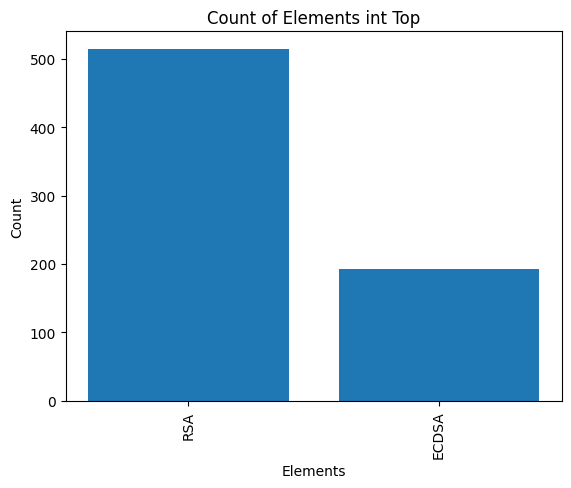

In [86]:
TopAlgoCount = Counter(topAlgo)

elements = [item[0] for item in TopAlgoCount.most_common()]
counts = [item[1] for item in TopAlgoCount.most_common()]


plt.bar(elements, counts)
plt.xticks(rotation='vertical')

plt.xlabel('Elements')
plt.ylabel('Count')
plt.title('Count of Elements int Top')
plt.show()

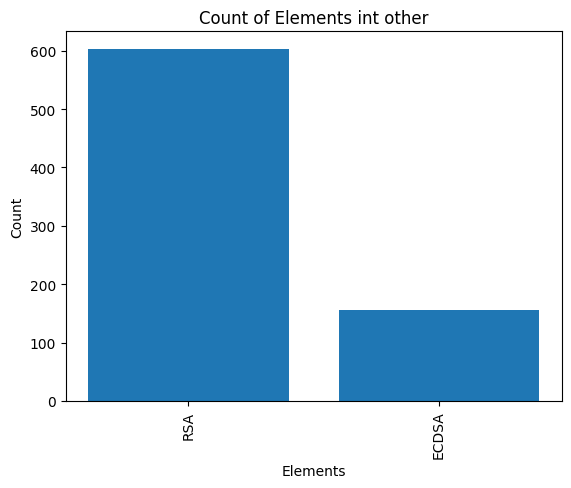

In [88]:
OtherAlgoCount = Counter(otherAlgo)

elements = [item[0] for item in OtherAlgoCount.most_common()]
counts = [item[1] for item in OtherAlgoCount.most_common()]


plt.bar(elements, counts)
plt.xticks(rotation='vertical')

plt.xlabel('Elements')
plt.ylabel('Count')
plt.title('Count of Elements int other')
plt.show()

In [96]:
topAlgoKeyLen = []
otherAlgoKeyLen = []

def get_algo(cert):
   res =  cert.get_pubkey().to_cryptography_key().key_size
   return res
    

for i in range(len(topcert)):
   topAlgoKeyLen.append(get_algo(topcert[i])) 

for i in range(len(othercert)):
   otherAlgoKeyLen.append(get_algo(othercert[i])) 

print(topAlgoKeyLen)

[256, 256, 2048, 256, 256, 256, 2048, 256, 2048, 256, 256, 2048, 2048, 2048, 256, 256, 256, 2048, 2048, 256, 2048, 2048, 256, 256, 256, 256, 256, 2048, 2048, 2048, 256, 2048, 256, 2048, 256, 256, 256, 2048, 256, 256, 256, 2048, 2048, 2048, 2048, 2048, 2048, 256, 256, 256, 256, 2048, 2048, 2048, 2048, 2048, 256, 256, 2048, 256, 256, 2048, 2048, 2048, 256, 256, 2048, 2048, 256, 2048, 2048, 2048, 256, 2048, 2048, 256, 256, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 256, 2048, 256, 256, 2048, 2048, 2048, 2048, 256, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 4096, 256, 256, 2048, 2048, 256, 256, 2048, 2048, 256, 2048, 2048, 2048, 2048, 256, 2048, 256, 2048, 2048, 2048, 2048, 256, 2048, 256, 2048, 2048, 256, 2048, 256, 2048, 2048, 2048, 2048, 256, 2048, 256, 2048, 2048, 256, 256, 2048, 2048, 2048, 256, 256, 256, 2048, 2048, 2048, 2048, 2048, 256, 2048, 2048, 256, 2048, 256, 2048, 256, 2048, 256, 2048, 2048, 256, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 2048, 256, 2048,

In [106]:
TopAlgoCountLen = Counter(topAlgoKeyLen)
print(TopAlgoCountLen)

otherAlgoCountlen = Counter(otherAlgoKeyLen)
print(otherAlgoCountlen)

Counter({2048: 500, 256: 192, 4096: 14, 384: 1})
Counter({2048: 553, 256: 144, 4096: 45, 384: 12, 3072: 5})


In [116]:
topExp = []
otherEx=[]
def get_exp(cert):
    key = cert.get_pubkey()
    if key.type() == 408:
        return None
    else: 
        return key.to_cryptography_key().public_numbers().e
    

    
    
for i in range(len(topcert)):
   topExp.append(get_exp(topcert[i])) 

for i in range(len(othercert)):
   otherEx.append(get_exp(othercert[i])) 

In [117]:
print(Counter(topExp))
print(Counter(otherEx))

Counter({65537: 514, None: 193})
Counter({65537: 603, None: 156})


In [121]:
print(topcert[0].get_signature_algorithm())


b'sha256WithRSAEncryption'


In [124]:
topsig = []
othersig=[]
def get_sig(cert):
    return cert.get_signature_algorithm()


for i in range(len(topcert)):
   topsig.append(get_sig(topcert[i])) 

for i in range(len(othercert)):
   othersig.append(get_sig(othercert[i])) 


print(Counter(topsig))
print(Counter(othersig))

Counter({b'sha256WithRSAEncryption': 597, b'ecdsa-with-SHA256': 63, b'ecdsa-with-SHA384': 27, b'sha384WithRSAEncryption': 20})
Counter({b'sha256WithRSAEncryption': 628, b'ecdsa-with-SHA384': 73, b'ecdsa-with-SHA256': 43, b'sha384WithRSAEncryption': 15})
